# EJERCICIOS

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow_hub as hub
from keras.utils import to_categorical

2025-02-17 18:17:09.034668: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-17 18:17:09.042346: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-17 18:17:09.050649: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-17 18:17:09.053258: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-17 18:17:09.060157: I tensorflow/core/platform/cpu_feature_guar

In [9]:
print("Dispositivos disponibles:")
for device in tf.config.list_physical_devices():
    print(device)

Dispositivos disponibles:
PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


## EJERCICIO 1

Crea tu propia CNN desde el principio e intenta conseguir la mayor exactitud posible con MNIST (por ejemplo 99% en el conjunto de prueba).

En vez de crear un conjunto de validación en el fit indica que porcentaje (10%) vas a usar para el conjunto de validación (validation_split)

Por ejemplo:
* 2 capas convolucionales (32 filtros)
* 1 capa maxpool
* 2 capas convolucionales (64 filtros)
* 1 capa maxpool
* 1 capa flatten
* 1 capa dropout
* 1 capa densa oculta
* 1 capa dropout
* 1 capa densa de salida

Usá como función de pérdida categorical_crossentropy.

Ten en cuenta que:
* sparse_categorical_crossentropy: se usa cuando las etiquetas de las clases están representadas como enteros (codificación entera), por ejemplo: 0, 1, 2, 3, ... para n clasess
* categorical_crossentropy: se usa cuando las etiquetas están representadas en formato one-hot encoded.

Tal y com tenemos los datos podemos usar directamente sparse_categorical_crossentropy, para poder aplicar categorical_crossentropy hay que hacer una transformación en y (to_categorical).

Haz una predicción y muestra la imagen con la etiqueta real y la predicha.

In [8]:
from functools import partial
# Cargar los datos MNIST

(data_train, data_test) = tf.keras.datasets.mnist.load_data()

# Dividir los datos en imágenes y etiquetas
(x_train, y_train) = data_train
(x_test, y_test) = data_test

# Normalizar las imágenes a [0, 1]
x_train = x_train.astype("float32") / 255.0
x_test = x_test.astype("float32") / 255.0

# Agregar la dimensión del canal de color
x_train = x_train.reshape(-1, 28, 28, 1)  # (batch_size, 28, 28, 1)
x_test = x_test.reshape(-1, 28, 28, 1)

# Convertir las etiquetas a categoricas
y_train = tf.keras.utils.to_categorical(y_train, num_classes=10)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=10)

In [9]:
# Construir el modelo
tf.random.set_seed(42)
DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=3, padding="same", activation="relu", kernel_initializer="he_normal")
model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(28, 28, 1)),
    DefaultConv2D(filters=32),
    DefaultConv2D(filters=32),
    tf.keras.layers.MaxPooling2D(),
    DefaultConv2D(filters=64),
    DefaultConv2D(filters=64),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(10, activation='softmax')
])

I0000 00:00:1738682951.192158   13372 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1738682951.192659   13372 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1738682951.192895   13372 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1738682951.256773   13372 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [10]:
import random
model.compile(loss="categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
history = model.fit(x_train, y_train, epochs=25, validation_split=0.1)

Epoch 1/25


I0000 00:00:1738682952.970859   74399 service.cc:146] XLA service 0x79dc6c00da40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1738682952.970884   74399 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 4080 Laptop GPU, Compute Capability 8.9
2025-02-04 16:29:13.026716: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-02-04 16:29:13.108479: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90100


 164/1688 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5488 - loss: 1.3443

I0000 00:00:1738682954.676795   74399 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1688/1688 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8602 - loss: 0.4335 - val_accuracy: 0.9863 - val_loss: 0.0482
Epoch 2/25
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9744 - loss: 0.0880 - val_accuracy: 0.9898 - val_loss: 0.0332
Epoch 3/25
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 2s 970us/step - accuracy: 0.9794 - loss: 0.0676 - val_accuracy: 0.9910 - val_loss: 0.0324
Epoch 4/25
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 2s 990us/step - accuracy: 0.9835 - loss: 0.0551 - val_accuracy: 0.9912 - val_loss: 0.0309
Epoch 5/25
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 2s 957us/step - accuracy: 0.9855 - loss: 0.0484 - val_accuracy: 0.9923 - val_loss: 0.0277
Epoch 6/25
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9864 - loss: 0.0444 - val_accuracy: 0.9922 - val_loss: 0.0323
Epoch 7/25
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 2s 993us/step - accuracy: 0.9880 - loss: 0.0395 - val_accuracy: 0.9918 - val_loss: 0.0342
Epoch 8/25
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 2s 964us/step - accuracy: 0.9894 - loss: 0.0367 - v

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
Etiqueta real: 6
Etiqueta predecida: 6


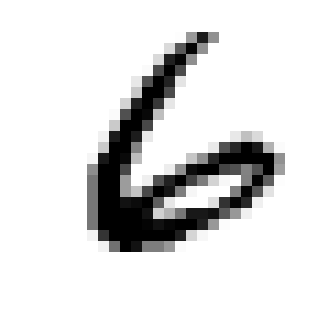

In [11]:
i = random.randint(1,len(x_test))
plt.figure(figsize=(4, 4))
plt.imshow(x_test[i],cmap='gray_r')
plt.axis("off")
pred = model.predict(x_test[i].reshape(1, 28, 28, 1))
print(f"Etiqueta real: {np.argmax(y_test[i])}")
print(f"Etiqueta predecida: {np.argmax(pred)}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━

(-0.5, 27.5, 27.5, -0.5)

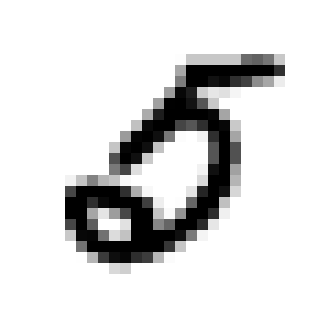

In [12]:
# Predicciones hasta fallar
real = 0
predict = 0
tries = 0
while real == predict:
    tries += 1
    i = random.randint(1,len(x_test))
    real = np.argmax(y_test[i])
    model.predict(x_test[i].reshape(1, 28, 28, 1))
    pred = model.predict(x_test[i].reshape(1, 28, 28, 1))
    predict = np.argmax(pred)

print(f"Fallo con muestra {i}, etiqueta real {real} y predicción {predict}. {tries} de intentos")
plt.figure(figsize=(4, 4))
plt.imshow(x_test[i],cmap='gray_r')
plt.axis("off")

## EJERCICIO 2

Haz unas fotos con tu movil (a objetos) y usando alguno de los modelos que existen (por ejemplo ResNet101V2). Tendrás de adecuar el tamaño de las fotos antes de intentar predecir que es lo que has fotografiado.

Tendrás que investigar como añadir cargar tus images, un buen sitio por donde empezar es por la documentación de Keras para ResNEt101V2.

In [13]:
resnet = tf.keras.applications.ResNet101V2(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
    name="resnet101v2",
)

In [14]:
import requests

# URL para descargar las clases de ImageNet
url = "https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json"
response = requests.get(url)
class_idx = response.json()

# Mostrar algunas de las clases
for i in range(10):  # Imprimir las primeras 10 clases
    print(class_idx[str(i)][1])  # El segundo elemento es el nombre de la clase


tench
goldfish
great_white_shark
tiger_shark
hammerhead
electric_ray
stingray
cock
hen
ostrich


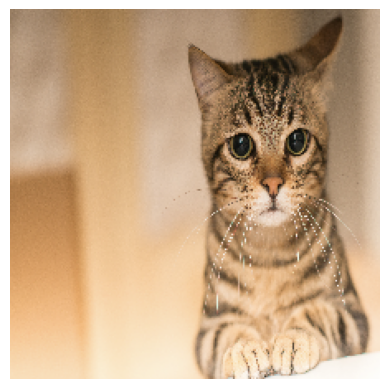

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Predicted: [('n02123045', 'tabby', 0.656809), ('n02123159', 'tiger_cat', 0.33843824), ('n02124075', 'Egyptian_cat', 0.0047384934)]


In [15]:
resnetv2 = tf.keras.applications.ResNet101V2(weights='imagenet')
img_path = 'datos/gato.png' # Un gato aleatorio de Google
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
plt.imshow(img)
plt.axis('off')
plt.show()
x = tf.keras.utils.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = tf.keras.applications.resnet_v2.preprocess_input(x)

preds = resnetv2.predict(x)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', tf.keras.applications.resnet50.decode_predictions(preds, top=3)[0])

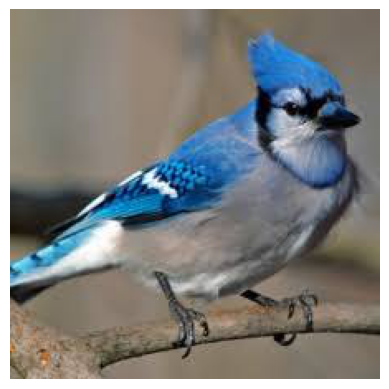

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Predicted: [('n01580077', 'jay', 0.9999944), ('n01537544', 'indigo_bunting', 4.1830017e-06), ('n02268853', 'damselfly', 1.3963633e-07)]


In [16]:
img_path = 'datos/jay.jpeg' # Una de las fotos de imagenet
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
plt.imshow(img)
plt.axis('off')
plt.show()
x = tf.keras.utils.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = tf.keras.applications.resnet_v2.preprocess_input(x)

preds = resnetv2.predict(x)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', tf.keras.applications.resnet50.decode_predictions(preds, top=3)[0])

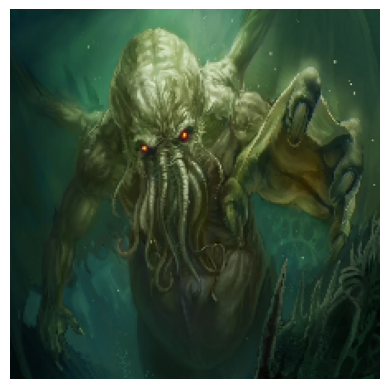

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Predicted: [('n01968897', 'chambered_nautilus', 0.15731005), ('n09229709', 'bubble', 0.1095643), ('n03916031', 'perfume', 0.10158828)]


In [17]:
img_path = 'datos/cthulhu.jpg' # Una clase que no esta entre las 1000
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
plt.imshow(img)
plt.axis('off')
plt.show()
x = tf.keras.utils.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = tf.keras.applications.resnet_v2.preprocess_input(x)

preds = resnetv2.predict(x)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', tf.keras.applications.resnet50.decode_predictions(preds, top=3)[0])

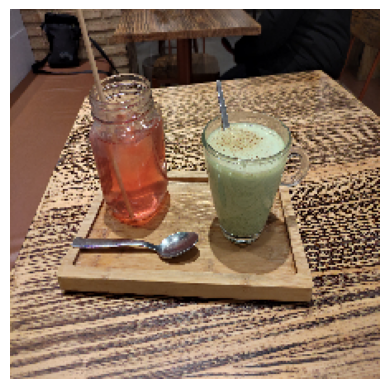

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Predicted: [('n02823750', 'beer_glass', 0.88581306), ('n04476259', 'tray', 0.068896875), ('n03062245', 'cocktail_shaker', 0.010614967)]


In [18]:
img_path = 'datos/mi_te.jpg' # Una foto de mi móvil
img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
plt.imshow(img)
plt.axis('off')
plt.show()
x = tf.keras.utils.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = tf.keras.applications.resnet_v2.preprocess_input(x)

preds = resnetv2.predict(x)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', tf.keras.applications.resnet50.decode_predictions(preds, top=3)[0])

## EJERCICIO 3

El dataset food101 es un conjunto de datos consta de 101 categorías de alimentos, con 101000 imágenes. Para cada clase, se proporcionan 250 imágenes de prueba revisadas manualmente, así como 750 imágenes de entrenamiento. A propósito, las imágenes de entrenamiento no se limpiaron y, por lo tanto, aún contienen cierta cantidad de ruido. Esto viene principalmente en forma de colores intensos y, a veces, etiquetas incorrectas. Todas las imágenes se redimensionaron para tener una longitud lateral máxima de 512 píxeles.
* Carga el conjunto de imagenes: entrenamiento, validación (coge la mitad de los datos de prueba) y prueba (coge la otra mitad de los datos de prueba)
* Explora los datos: dimensiones, número de elementos, dibuja algunas imagenes con sus etiquetas...
* Prepara los datos: añade más elementos al conjunto de entrenamiento (rotando, trasladando... las imagenes acutales), cambia el tamaño para que sea adecuado para el modelo, normaliza...
* Entrena un modelo para estos datos usando algunas de las redes ya existentes (por ejemplo: MobileNetV2): coge todo menos la última capa y añade una capa globalaveragepooling y la capa dense de salida. En este caso utiliza como función de pérdida sparse_categorical_crossentropy
* Busca una imagen de comida en Internet y haz una predicción

Por defecto tensorflow busca y descarga los dato en:
* Linux/Mac: ~/tensorflow_datasets/
* Windows: C:\Users\<usuario>\tensorflow_datasets\

Los datos puedes copiarlo de mi disco duro o descarlos, pero son 5.12GB

In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# Cargar el conjunto de datos Food101 desde TFDS
data, info = tfds.load('food101', split=["validation[:50%]", "validation[50%:]", "train"], with_info=True, as_supervised=True)

# Separar por train, validación y test
train_set_original_raw = data[2]  # train
test_set_raw = data[0]  # test[:50%]
valid_set_raw = data[1]  # test[50%:]

# Obtener las clases
class_names = info.features['label'].names

I0000 00:00:1739812639.731161   30768 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1739812639.758215   30768 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1739812639.758427   30768 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1739812639.760325   30768 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [4]:
# Obtener tamaño de cada muestra
print("Tamaño del vector de cada imagen:", next(iter(test_set_raw))[0][0].shape)
print("Número de elementos de la primera imagen:", tf.size(next(iter(test_set_raw))[0][0]).numpy())

num_test = sum(1 for _ in test_set_raw)
num_val = sum(1 for _ in valid_set_raw)
num_train = sum(1 for _ in train_set_original_raw)
print("Número total de imágenes en el conjunto de prueba:", num_test)
print("Número total de imágenes en el conjunto de validacion:", num_val)
print("Número total de imágenes en el conjunto de entrenamiento:", num_train)

Tamaño del vector de cada imagen: (512, 3)
Número de elementos de la primera imagen: 1536


2025-02-11 15:22:53.742650: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-02-11 15:22:57.519444: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Número total de imágenes en el conjunto de prueba: 12625
Número total de imágenes en el conjunto de validacion: 12625
Número total de imágenes en el conjunto de entrenamiento: 75750


imagenes de entrenamiento


2025-02-11 15:23:41.836534: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


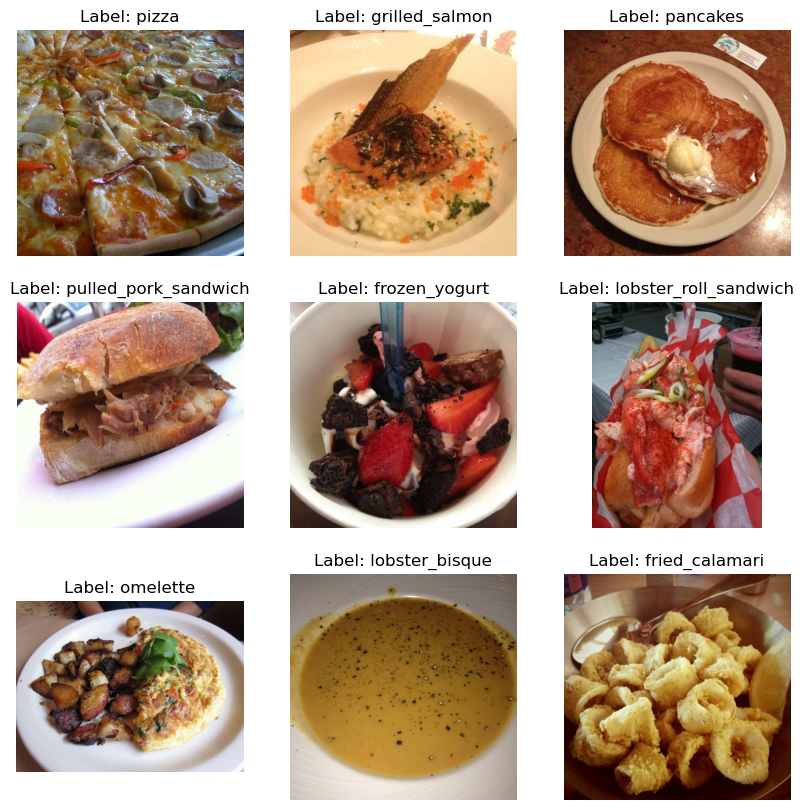

imagenes de validación


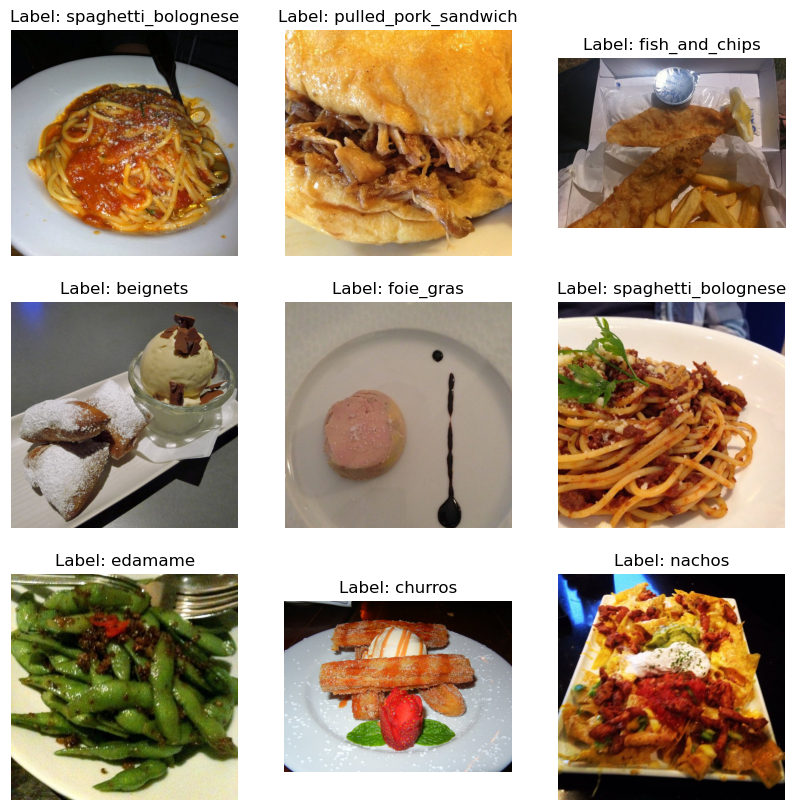

imagenes de prueba


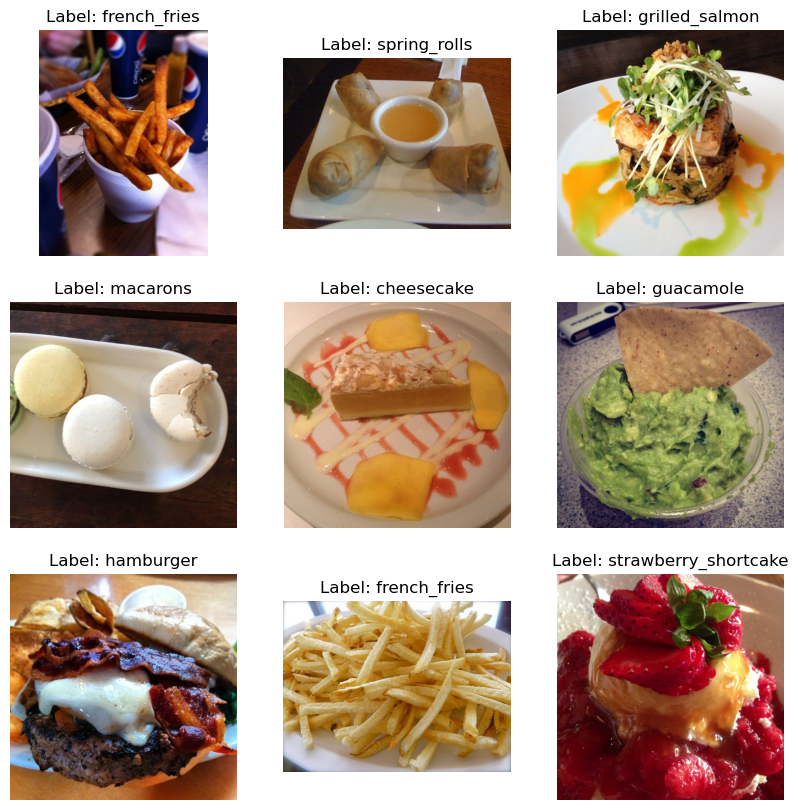

In [5]:
import matplotlib.pyplot as plt

# Función para mostrar algunas imágenes
def plot_images(dataset, num_images=9):
    # Mezclamos el dataset antes de tomar las imágenes
    dataset = dataset.shuffle(buffer_size=1000)  # Shuffle para aleatorizar el orden
    plt.figure(figsize=(10, 10))
    
    for i, (image, label) in enumerate(dataset.take(num_images)):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image.numpy())  # Convertimos a numpy para mostrar en matplotlib
        plt.title(f"Label: {class_names[label.numpy()]}")
        plt.axis("off")
    
    plt.show()

# Mostrar algunas imágenes del conjunto de entrenamiento
print("imagenes de entrenamiento")
plot_images(train_set_original_raw)

# Mostrar algunas imágenes del nuevo conjunto de validación
print("imagenes de validación")
plot_images(valid_set_raw)

# Mostrar algunas imágenes del nuevo conjunto de prueba
print("imagenes de prueba")
plot_images(test_set_raw)

In [3]:
import tensorflow as tf

# Tamaño de la imagen de entrada
IMG_SIZE = 224
EPOCHS = 5

# Aumento de datos
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),   # Volteo horizontal aleatorio
    tf.keras.layers.RandomRotation(0.2),  # Rotación aleatoria (20% en cada dirección)
    tf.keras.layers.RandomZoom(0.2),  # Zoom aleatorio (20%)
    tf.keras.layers.RandomContrast(0.2),  # Contraste aleatorio
    tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2)  # Desplazamientos aleatorios
])

def augment_image(image, label):
    image = data_augmentation(image)
    return image, label

def preprocess_image(image, label):
    # Redimensionar la imagen a IMG_SIZE x IMG_SIZE
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    # Normalizar la imagen (entre -1 y 1)
    image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
    return image, label

train_set_preprocessed = train_set_original_raw.map(preprocess_image)
train_set_augmented = train_set_original_raw.map(preprocess_image).map(augment_image)
train_set_full = train_set_preprocessed.concatenate(train_set_augmented)
train_set = train_set_full.batch(32)

valid_set_preprocessed = valid_set_raw.map(preprocess_image)
valid_set_augmented = valid_set_raw.map(preprocess_image).map(augment_image)
valid_set_full = valid_set_preprocessed.concatenate(valid_set_augmented)
valid_set = valid_set_full.batch(32)

test_set_preprocessed = test_set_raw.map(preprocess_image)
test_set_augmented = test_set_raw.map(preprocess_image).map(augment_image)
test_set = test_set_preprocessed.concatenate(test_set_augmented)


In [6]:
# Crear el modelo con MobileNetV2 congelado en la primera fase de entrenamiento
base_model = tf.keras.applications.MobileNetV2(input_shape=(IMG_SIZE, IMG_SIZE, 3), include_top=False, weights='imagenet')

# Congelar las capas del modelo base (MobileNetV2) al principio
base_model.trainable = False

# Construir el modelo
model = tf.keras.Sequential([
    base_model,         # MobileNetV2 sin capas superiores
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(101, activation='softmax')  # Número de clases para Food101
])

# Compilar el modelo
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Entrenar el modelo con las capas congeladas (solo la última capa entrenará), take 10 para mas velocidad de ejecucion aunque empeore el resultado
model.fit(train_set.take(10), epochs=EPOCHS, validation_data=valid_set.take(10))

Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 181ms/step - accuracy: 0.0115 - loss: 5.0635 - val_accuracy: 0.0437 - val_loss: 4.8818
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.2821 - loss: 3.2595 - val_accuracy: 0.0781 - val_loss: 4.6059
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6095 - loss: 2.3782 - val_accuracy: 0.0969 - val_loss: 4.2965
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8994 - loss: 1.5796 - val_accuracy: 0.1187 - val_loss: 4.0792
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9634 - loss: 1.0156 - val_accuracy: 0.1281 - val_loss: 3.9674


In [8]:
for i, layer in enumerate(base_model.layers):
    print(f"Capa {i+1}: {layer.name}, Tipo: {layer.__class__.__name__}")

Capa 1: input_layer_5, Tipo: InputLayer
Capa 2: Conv1, Tipo: Conv2D
Capa 3: bn_Conv1, Tipo: BatchNormalization
Capa 4: Conv1_relu, Tipo: ReLU
Capa 5: expanded_conv_depthwise, Tipo: DepthwiseConv2D
Capa 6: expanded_conv_depthwise_BN, Tipo: BatchNormalization
Capa 7: expanded_conv_depthwise_relu, Tipo: ReLU
Capa 8: expanded_conv_project, Tipo: Conv2D
Capa 9: expanded_conv_project_BN, Tipo: BatchNormalization
Capa 10: block_1_expand, Tipo: Conv2D
Capa 11: block_1_expand_BN, Tipo: BatchNormalization
Capa 12: block_1_expand_relu, Tipo: ReLU
Capa 13: block_1_pad, Tipo: ZeroPadding2D
Capa 14: block_1_depthwise, Tipo: DepthwiseConv2D
Capa 15: block_1_depthwise_BN, Tipo: BatchNormalization
Capa 16: block_1_depthwise_relu, Tipo: ReLU
Capa 17: block_1_project, Tipo: Conv2D
Capa 18: block_1_project_BN, Tipo: BatchNormalization
Capa 19: block_2_expand, Tipo: Conv2D
Capa 20: block_2_expand_BN, Tipo: BatchNormalization
Capa 21: block_2_expand_relu, Tipo: ReLU
Capa 22: block_2_depthwise, Tipo: Depthwi

In [10]:
# Descongelar medio modelo a partir del bloque 6, que es la capa 63
for layer in model.layers[63:]:
    if not isinstance(layer, tf.keras.layers.BatchNormalization):  # Evitar problemas con BN
        layer.trainable = True

# Volver a compilar el modelo para aplicar los cambios
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), 
                     loss='sparse_categorical_crossentropy', 
                     metrics=['accuracy'])

# Entrenar nuevamente con todas las capas entrenables, menos epocas que tarda 7min por epoca sin descongelar capas
model.fit(train_set.take(10), epochs=5, validation_data=valid_set.take(10))

Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - accuracy: 0.9813 - loss: 0.7312 - val_accuracy: 0.1312 - val_loss: 3.9694
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9813 - loss: 0.7239 - val_accuracy: 0.1312 - val_loss: 3.9701
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.9813 - loss: 0.7195 - val_accuracy: 0.1312 - val_loss: 3.9707
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9813 - loss: 0.7154 - val_accuracy: 0.1312 - val_loss: 3.9713
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.9813 - loss: 0.7113 - val_accuracy: 0.1312 - val_loss: 3.9719


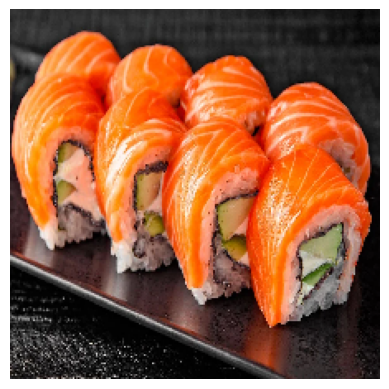

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predicción de clase: hamburger


In [11]:
# Ruta de la imagen
img_path = 'datos/sushi.jpg'

# Cargar la imagen
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))  # Redimensionar la imagen

# Convertir la imagen a un arreglo numpy
img_array = tf.keras.preprocessing.image.img_to_array(img)

# Expande las dimensiones para que coincida con el formato (batch_size, height, width, channels)
img_array = np.expand_dims(img_array, axis=0)

# Normalizar la imagen
img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

# Mostrar la imagen para verificar
plt.imshow(img)
plt.axis('off')
plt.show()

# Hacer la predicción
predictions = model.predict(img_array)

# Obtener la clase con la mayor probabilidad
predicted_class = np.argmax(predictions, axis=1)

# Mapeo de índices a etiquetas
labels = info.features['label'].int2str

# Decodificar la clase en etiqueta
predicted_label = labels(predicted_class[0])

# Imprimir la clase predicha
print(f"Predicción de clase: {predicted_label}")

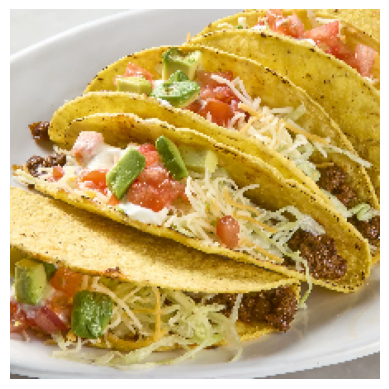

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Predicción de clase: lobster_roll_sandwich


In [12]:
# Ruta de la imagen
img_path = 'datos/tacos.jpeg'

# Cargar la imagen
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))  # Redimensionar la imagen

# Convertir la imagen a un arreglo numpy
img_array = tf.keras.preprocessing.image.img_to_array(img)

# Expande las dimensiones para que coincida con el formato (batch_size, height, width, channels)
img_array = np.expand_dims(img_array, axis=0)

# Normalizar la imagen
img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

# Mostrar la imagen para verificar
plt.imshow(img)
plt.axis('off')
plt.show()

# Hacer la predicción
predictions = model.predict(img_array)

# Obtener la clase con la mayor probabilidad
predicted_class = np.argmax(predictions, axis=1)

# Mapeo de índices a etiquetas
labels = info.features['label'].int2str

# Decodificar la clase en etiqueta
predicted_label = labels(predicted_class[0])

# Imprimir la clase predicha
print(f"Predicción de clase: {predicted_label}")

## EJERCICIO 4

Repite el ejercicio pero para otros datos (tienes conjuntos de datos en https://www.tensorflow.org/datasets/catalog/overview?hl=es-419 en el apartado image classificación, por ejemplo puedes usar stanford_dogs) y utilizando otra de las redes conocidas que no se haya utilizado todavía.
Para cargar los datos en este caso vas a descargar las imagnes a tu ordenador y cargarlos desde ahi (descargar la carpeta al ordenador y luego cargarlo desde la carpeta con python (mage_dataset_from_director)):

* Carga el conjunto de imagenes (entrenamiento, validación y pruebas)
* Explora los datos: dimensiones, número de elementos, dibuja algunas imagenes con sus etiquetas...
* Prepara los datos: añadir más elementos al conjunto de entrenamiento (rotando, trasladando... las imagenes acutales), cambiar el tamaño para que sea adecuado para el modelo, normalizar...
* Entrena un modelo para estos datos usando algunas de las redes ya existentes (por ejemplo: MobileNetV2)
* Busa una imagen en Internet y haz una predicción

In [23]:
# Cargar los datos desde local
dogs_dataset = tf.keras.utils.image_dataset_from_directory(
    "datos/Standford-dogs",
    labels='inferred',
    label_mode='int',
    class_names=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(224, 224), # Tamaño estandard de los modelos preentrenados
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False
)

# Dividir el conjunto
dogs_length = len(dogs_dataset)
train_length = int(0.6 * dogs_length)
val_length = int(0.2 * dogs_length)

dogs_train = dogs_dataset.take(train_length)
dogs_val = dogs_dataset.skip(train_length).take(val_length)
dogs_test = dogs_dataset.skip(train_length + val_length)

Found 20580 files belonging to 120 classes.


In [24]:
class_names = dogs_dataset.class_names
print(f"Clases: {class_names}")

Clases: ['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yor

Dimensiones del batch de imágenes: (32, 224, 224, 3)
Dimensiones del batch de etiquetas: (32,)


2025-02-17 18:29:15.561137: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


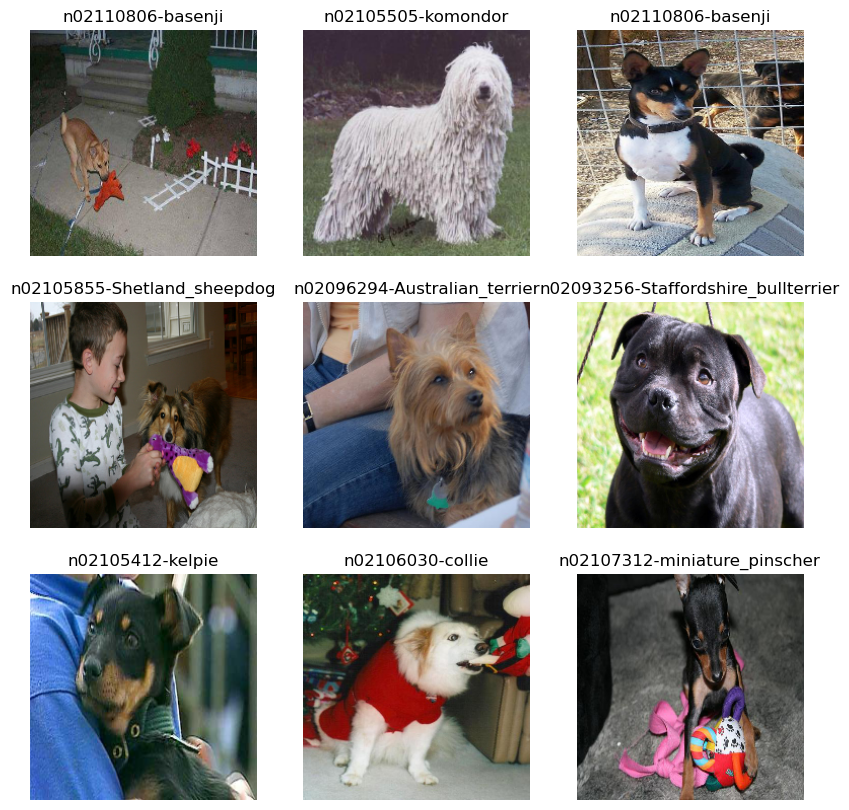

In [25]:
for image_batch, labels_batch in dogs_dataset.take(1):
    print(f"Dimensiones del batch de imágenes: {image_batch.shape}")
    print(f"Dimensiones del batch de etiquetas: {labels_batch.shape}")

    # Mostrar algunas imágenes
    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

In [26]:
import tensorflow as tf

# Preprocesar las imágenes (redimensionar y normalizar)
def preprocess_image(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.keras.applications.efficientnet.preprocess_input(image)
    return image, label

# Definir el data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip(mode="horizontal", seed=42),
    tf.keras.layers.RandomRotation(factor=0.05, seed=42),
    tf.keras.layers.RandomContrast(factor=0.2, seed=42)
])

train_set_preprocessed = dogs_train.map(preprocess_image)
train_set_augmented = dogs_train.map(preprocess_image).map(augment_image)
train_set_full = train_set_preprocessed.concatenate(train_set_augmented)

valid_set_preprocessed = dogs_val.map(preprocess_image)
valid_set_augmented = dogs_val.map(preprocess_image).map(augment_image)
valid_set_full = valid_set_preprocessed.concatenate(valid_set_augmented)

test_set_preprocessed = dogs_test.map(preprocess_image)
test_set_augmented = dogs_test.map(preprocess_image).map(augment_image)
dogs_test = test_set_preprocessed.concatenate(test_set_augmented)

In [27]:
import tensorflow as tf

# Cargar EfficientNetB0 preentrenado
base_model = tf.keras.applications.EfficientNetB0(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Congelar todas las capas del modelo base
base_model.trainable = False

# Crear el modelo con EfficientNetB0
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(120, activation='softmax')  # Número de clases en Stanford Dogs
])

# Compilar el modelo
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Entrenar el modelo con las capas congeladas
model.fit(dogs_train.take(10), epochs=5, validation_data=dogs_val.take(10))


Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 526ms/step - accuracy: 0.0145 - loss: 4.8000 - val_accuracy: 0.1219 - val_loss: 4.4278
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 230ms/step - accuracy: 0.3283 - loss: 3.9822 - val_accuracy: 0.3063 - val_loss: 3.9704
Epoch 3/5


2025-02-17 18:29:57.596993: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 19267840 bytes after encountering the first element of size 19267840 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step - accuracy: 0.6159 - loss: 3.2228 - val_accuracy: 0.3719 - val_loss: 3.5255
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step - accuracy: 0.7604 - loss: 2.5465 - val_accuracy: 0.4594 - val_loss: 3.0933
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.8127 - loss: 2.0409 - val_accuracy: 0.4656 - val_loss: 2.8098


In [28]:
for i, layer in enumerate(base_model.layers):
    print(f"Capa {i+1}: {layer.name}, Tipo: {layer.__class__.__name__}")

Capa 1: input_layer_14, Tipo: InputLayer
Capa 2: rescaling_4, Tipo: Rescaling
Capa 3: normalization_2, Tipo: Normalization
Capa 4: rescaling_5, Tipo: Rescaling
Capa 5: stem_conv_pad, Tipo: ZeroPadding2D
Capa 6: stem_conv, Tipo: Conv2D
Capa 7: stem_bn, Tipo: BatchNormalization
Capa 8: stem_activation, Tipo: Activation
Capa 9: block1a_dwconv, Tipo: DepthwiseConv2D
Capa 10: block1a_bn, Tipo: BatchNormalization
Capa 11: block1a_activation, Tipo: Activation
Capa 12: block1a_se_squeeze, Tipo: GlobalAveragePooling2D
Capa 13: block1a_se_reshape, Tipo: Reshape
Capa 14: block1a_se_reduce, Tipo: Conv2D
Capa 15: block1a_se_expand, Tipo: Conv2D
Capa 16: block1a_se_excite, Tipo: Multiply
Capa 17: block1a_project_conv, Tipo: Conv2D
Capa 18: block1a_project_bn, Tipo: BatchNormalization
Capa 19: block2a_expand_conv, Tipo: Conv2D
Capa 20: block2a_expand_bn, Tipo: BatchNormalization
Capa 21: block2a_expand_activation, Tipo: Activation
Capa 22: block2a_dwconv_pad, Tipo: ZeroPadding2D
Capa 23: block2a_dwco

In [29]:
# Descongelar a partir del bloque 4c en la capa 120
for layer in base_model.layers[120:]:
    layer.trainable = True

# Volver a compilar el modelo para aplicar los cambios
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), 
                     loss='sparse_categorical_crossentropy', 
                     metrics=['accuracy'])

# Entrenar nuevamente
model.fit(dogs_train.take(10), epochs=5, validation_data=dogs_val.take(10))

Epoch 1/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 23s 533ms/step - accuracy: 0.5802 - loss: 3.1604 - val_accuracy: 0.5281 - val_loss: 2.7325
Epoch 2/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - accuracy: 0.5727 - loss: 3.1179 - val_accuracy: 0.4656 - val_loss: 2.8038
Epoch 3/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - accuracy: 0.5938 - loss: 3.0250 - val_accuracy: 0.4344 - val_loss: 2.9329
Epoch 4/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.6099 - loss: 3.0331 - val_accuracy: 0.4375 - val_loss: 2.8690
Epoch 5/5
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - accuracy: 0.5921 - loss: 2.9533 - val_accuracy: 0.4500 - val_loss: 2.8880


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
La clase predicha es: n02106550-Rottweiler


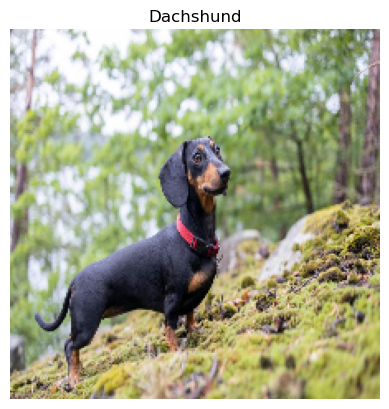

In [30]:
# Cargar y preprocesar la imagen de prueba
image = tf.io.read_file("datos/perro_salchicha.jpg")
image = tf.image.decode_jpeg(image, channels=3)
image = tf.image.resize(image, (224, 224))
plt.imshow(image.numpy().astype("uint8"))
plt.title("Dachshund")
plt.axis("off")
image = tf.keras.applications.efficientnet.preprocess_input(image)

# Convertir la imagen a un lote (batch)
image = tf.expand_dims(image, axis=0)

# Hacer la predicción
predictions = model.predict(image)

# Obtener la clase predicha (índice con mayor probabilidad)
predicted_class = class_names[tf.argmax(predictions[0]).numpy()]
print(f"La clase predicha es: {predicted_class}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
La clase predicha es: n02093647-Bedlington_terrier


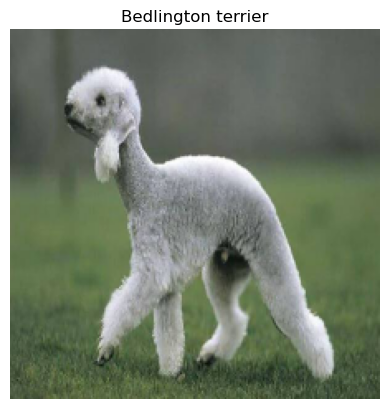

In [31]:
# Cargar y preprocesar la imagen de prueba
image = tf.io.read_file("datos/perro_raro.jpg")
image = tf.image.decode_jpeg(image, channels=3)
image = tf.image.resize(image, (224, 224))
plt.imshow(image.numpy().astype("uint8"))
plt.title("Bedlington terrier")
plt.axis("off")
image = tf.keras.applications.efficientnet.preprocess_input(image)

# Convertir la imagen a un lote (batch)
image = tf.expand_dims(image, axis=0)

# Hacer la predicción
predictions = model.predict(image)

# Obtener la clase predicha (índice con mayor probabilidad)
predicted_class = class_names[tf.argmax(predictions[0]).numpy()]
print(f"La clase predicha es: {predicted_class}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
La clase predicha es: n02112018-Pomeranian


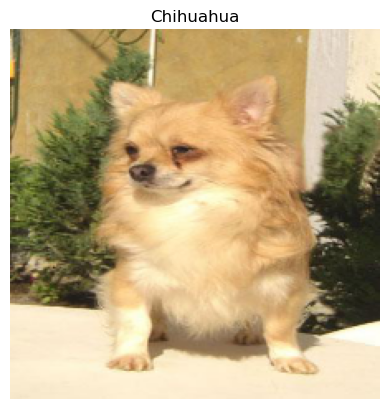

In [32]:
# Cargar y preprocesar la imagen de prueba
image = tf.io.read_file("datos/Imagenet_chihuahua.jpg")
image = tf.image.decode_jpeg(image, channels=3)
image = tf.image.resize(image, (224, 224))
plt.imshow(image.numpy().astype("uint8"))
plt.title("Chihuahua")
plt.axis("off")
image = tf.keras.applications.efficientnet.preprocess_input(image)

# Convertir la imagen a un lote (batch)
image = tf.expand_dims(image, axis=0)

# Hacer la predicción
predictions = model.predict(image)

# Obtener la clase predicha (índice con mayor probabilidad)
predicted_class = class_names[tf.argmax(predictions[0]).numpy()]
print(f"La clase predicha es: {predicted_class}")

## EJERCICIO 5

Sigue el tutorial de TensorFlow Style Transfer (https://homl.info/styletuto) hasta definir representaciones de contenido y estilo (hay que hacer sólo los primeros puntos, hasta el punto  Transferencia de estilo rápido usando TF-Hub (incluido)).

Haz algo parecido no igual (por lo menos cambia de imagenes).

Además tienes que poner comentarios para explicar con tus palabras lo que estas haciendo.

Realmente lo que esta haciendo es aplicar una capas convolucionales a una imagen, donde los filtros se han sacado de otra imagen.

In [19]:
# Cargar dependencias
import os
import tensorflow as tf

# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

# Definir conversor de tensor a imagen para luego
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

# Sacar la foto de contenido y la de estilo
content_path = tf.keras.utils.load_img("datos/gato_limpio.jpg")
style_path = tf.keras.utils.load_img("datos/picasso_style.jpeg")

In [20]:
img = tf.io.read_file("datos/cat_content.jpg")
print(f"Tipo después de leer: {type(img)}")

img = tf.image.decode_image(img, channels=3)
print(f"Forma después de decodificar: {img.shape}, Tipo: {img.dtype}")

img = tf.image.convert_image_dtype(img, tf.float32)
print(f"Tipo después de convertir: {img.dtype}")


Tipo después de leer: <class 'tensorflow.python.framework.ops.EagerTensor'>
Forma después de decodificar: (1000, 1000, 3), Tipo: <dtype: 'uint8'>
Tipo después de convertir: <dtype: 'float32'>


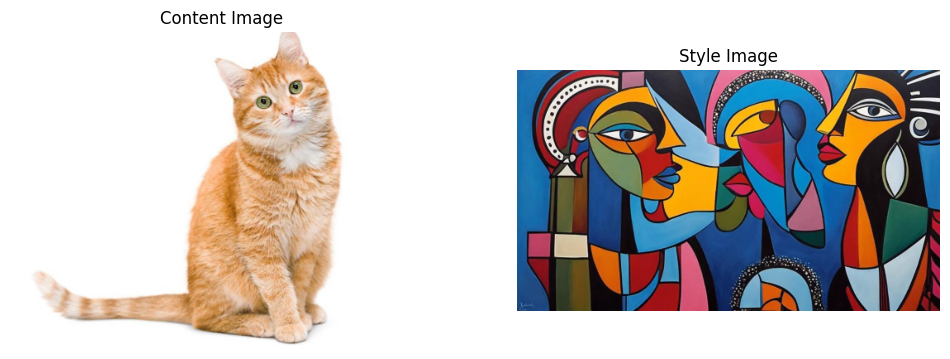

In [21]:
import tensorflow as tf

import tensorflow as tf
import numpy as np
from PIL import Image

# He tenido que pasarla por ChatGPT porque había un error de compatilibilidad con el tutorial
# de Tensorflow de 2018, al parecer usando PIL de Image se puede solventar
def load_img(image_input):
    """
    Carga una imagen desde una ruta o un objeto PIL, la redimensiona 
    y la convierte en un tensor adecuado para procesamiento.

    Args:
        image_input (str or PIL.Image): Ruta a la imagen o un objeto PIL.

    Returns:
        tf.Tensor: Imagen procesada como un tensor de dimensiones (1, altura, ancho, 3).
    """
    try:
        max_dim = 512

        # Manejo si la entrada es una ruta
        if isinstance(image_input, str):
            img = tf.io.read_file(image_input)
            img = tf.image.decode_jpeg(img, channels=3)  # Compatible con JPEG/JPG

        # Manejo si la entrada es un objeto PIL
        elif isinstance(image_input, Image.Image):
            img = np.array(image_input)
            img = tf.convert_to_tensor(img, dtype=tf.float32) / 255.0  # Normalizar

        else:
            raise ValueError("El input debe ser una ruta a la imagen o un objeto PIL.Image.")

        # Calcular dimensiones para mantener la proporción
        shape = tf.cast(tf.shape(img)[:-1], tf.float32)  # Excluir canales RGB
        long_dim = tf.reduce_max(shape)  # Dimensión más larga
        scale = max_dim / long_dim
        new_shape = tf.cast(shape * scale, tf.int32)

        # Redimensionar la imagen
        img = tf.image.resize(img, new_shape)

        # Añadir dimensión de batch
        img = tf.expand_dims(img, axis=0)

        return img

    except Exception as e:
        print(f"Error cargando la imagen {image_input}: {e}")
        return None



# Dibujar la imagen
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  plt.axis("off")
  if title:
    plt.title(title)

# Cargamos imagenes
content_image = load_img(content_path)
style_image = load_img(style_path)

# Visualizamos
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

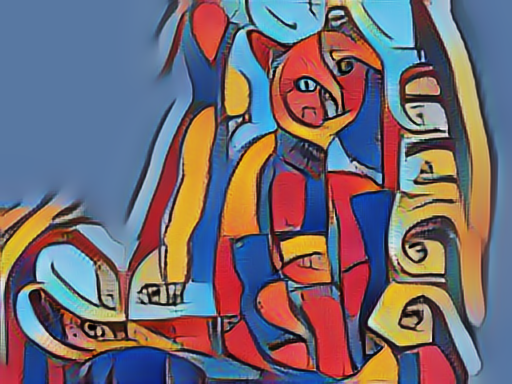

In [22]:
import tensorflow as tf
import tensorflow_hub as hub

# Usando tf-hub (el cual casca la instalación normal de tf, usar otro entorno aparte),
# aplicamos una capa convolucional contextual (estilo) a una imagen base (contenido)
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

In [23]:
# Cargamos el modelo vgg19 para hacerle una "autopsia" y mirar sus capas intermedias
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

TensorShape([1, 1000])

In [24]:
# Hacemos una prediccion de prueba para comprobar que ha cargado bien
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

[('tabby', np.float32(0.31131223)),
 ('tiger_cat', np.float32(0.30883715)),
 ('Egyptian_cat', np.float32(0.2537057)),
 ('lynx', np.float32(0.01465819)),
 ('Persian_cat', np.float32(0.0055592484))]

In [25]:
# Cargamos el modelo sin la capa final
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

print()
for layer in vgg.layers:
  print(layer.name)


input_layer_5
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [26]:
# Seleccionamos algunas capas intermedias convolucionales para extraer el "estilo" de la imagen
content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [27]:
# Funcion de carga de las capas intermedias
def vgg_layers(layer_names):
  """ Creates a VGG model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  
  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

# Las sacamos y analizamos las capas
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

block1_conv1
  shape:  (1, 292, 512, 64)
  min:  0.0
  max:  817.0829
  mean:  32.519764

block2_conv1
  shape:  (1, 146, 256, 128)
  min:  0.0
  max:  5442.0293
  mean:  183.92143

block3_conv1
  shape:  (1, 73, 128, 256)
  min:  0.0
  max:  12221.566
  mean:  256.49466

block4_conv1
  shape:  (1, 36, 64, 512)
  min:  0.0
  max:  21091.59
  mean:  865.74786

block5_conv1
  shape:  (1, 18, 32, 512)
  min:  0.0
  max:  3372.2249
  mean:  74.85351



/home/iabd/anaconda3/envs/tf-hub/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_140']
Received: inputs=Tensor(shape=(1, 292, 512, 3))
  warnings.warn(msg)


In [28]:
# Aplica una funcion matematica para calcular el estilo
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

# Creamos una clase custom de un modelo que devuelva sus tensores de estilo y contenido
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}
  
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())


/home/iabd/anaconda3/envs/tf-hub/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_162']
Received: inputs=Tensor(shape=(1, 383, 511, 3))
  warnings.warn(msg)


Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.0011114898
    max:  169461.5
    mean:  469.33282

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  266078.12
    mean:  12466.968

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  300301.94
    mean:  9491.422

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  4172648.8
    mean:  141416.7

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  88698.63
    mean:  1039.5177

Contents:
   block5_conv2
    shape:  (1, 23, 31, 512)
    min:  0.0
    max:  1568.4614
    mean:  10.44756


/home/iabd/anaconda3/envs/tf-hub/lib/python3.9/site-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_162']
Received: inputs=Tensor(shape=(1, 292, 512, 3))
  warnings.warn(msg)


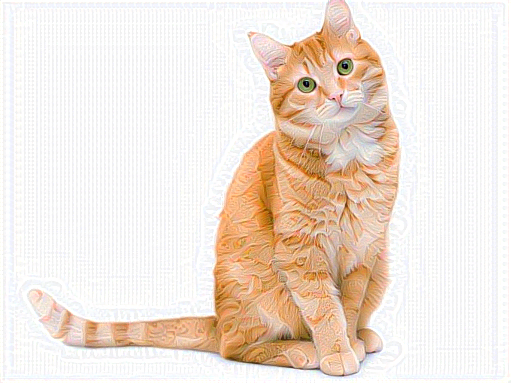

In [29]:
# Con todo lo anterior podemos aplicar el algoritmo de transferencia de estilos a mano
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

# Variable para la imagen
image = tf.Variable(content_image)

# Normalizador
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

# Optimizador
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Pesos de las capas
style_weight=1e-2
content_weight=1e4

# Funcion de perdida
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

# Funcion global para aplicar los cambios
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

# Algunos pasos de prueba
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

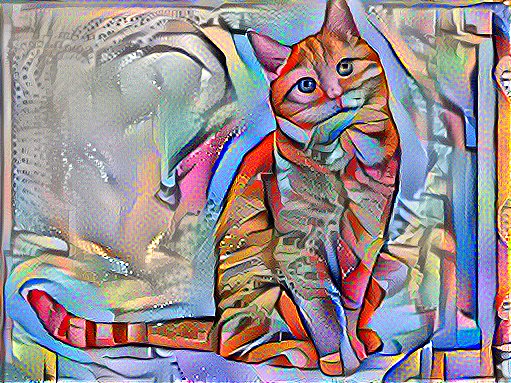

Train step: 1000
Total time: 29.6


In [30]:
# Usamos time para correr una ejecución más larga del algoritmo de transferencia de estilos
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

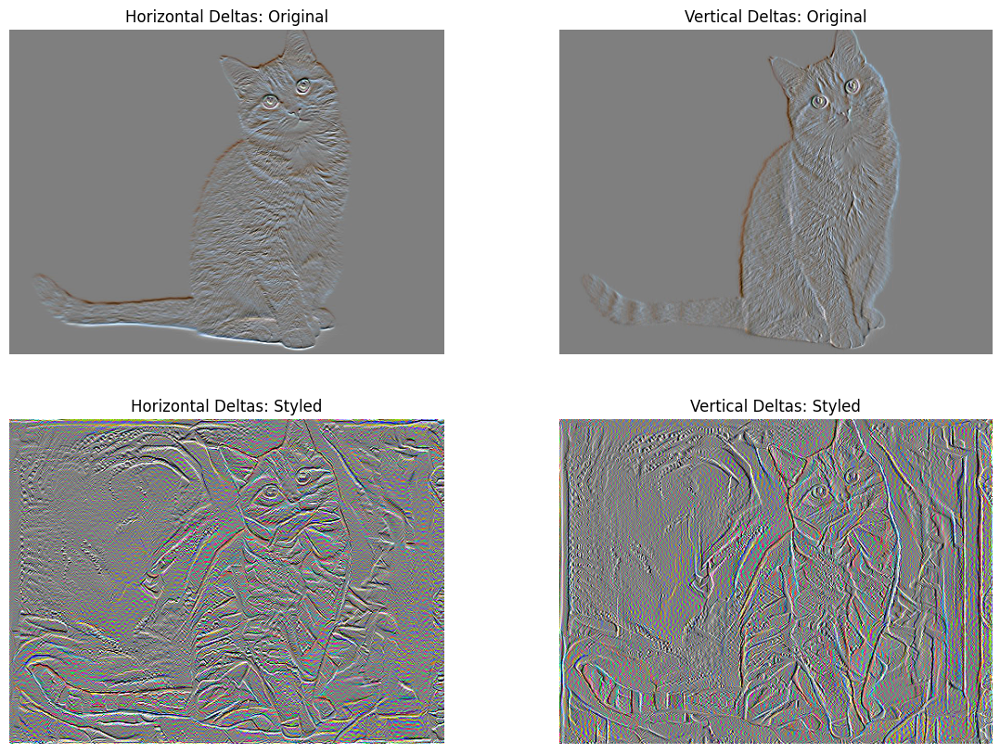

In [31]:
# Se puede suavizar la brusquedad del algorimo con una función de regularización
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return x_var, y_var

# Dibujamos
x_deltas, y_deltas = high_pass_x_y(content_image)

plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Original")

plt.subplot(2, 2, 2)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Original")

x_deltas, y_deltas = high_pass_x_y(image)

plt.subplot(2, 2, 3)
imshow(clip_0_1(2*y_deltas+0.5), "Horizontal Deltas: Styled")

plt.subplot(2, 2, 4)
imshow(clip_0_1(2*x_deltas+0.5), "Vertical Deltas: Styled")

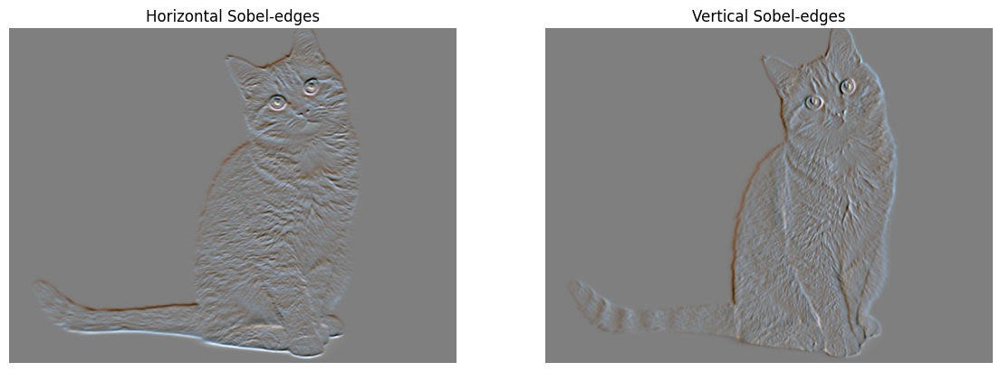

In [32]:
# Comparativa con el detector de bordes de Sobel
plt.figure(figsize=(14, 10))

sobel = tf.image.sobel_edges(content_image)
plt.subplot(1, 2, 1)
imshow(clip_0_1(sobel[..., 0]/4+0.5), "Horizontal Sobel-edges")
plt.subplot(1, 2, 2)
imshow(clip_0_1(sobel[..., 1]/4+0.5), "Vertical Sobel-edges")

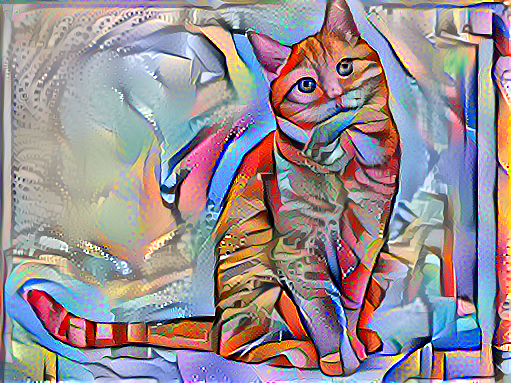

Train step: 1000
Total time: 30.5


In [33]:
# Ahora hacemos el proceso de transferencia con la regularización
total_variation_weight=30

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)

import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

## EJERCICIO 6

Crea un modelo sencillo que aplique un filtro personalizado a una imagen de contenido mediante una capa convolucional es un buen ejercicio para entender cómo funcionan las convoluciones en el procesamiento de imágenes.

Carga una imagen desde archivo preparala para se procesada por la red:
* Cargar la imagen (tf.keras.preprocessing.image.load_im)
* Convertir la imagen a un tensor de NumPy y redimensionarla:
    * tf.keras.preprocessing.image.img_to_array
    * tf.image.resize
* Añadir una dimensión de batch al tensor de la imagen (np.expand_dims)


In [55]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Función para cargar y preparar la imagen
def load_and_prepare_image(image_path, target_size=(256, 256)):
    # Cargar la imagen
    img = tf.keras.preprocessing.image.load_img(image_path)
    
    # Convertir la imagen a un tensor de NumPy
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    
    # Redimensionar la imagen
    img_resized = tf.image.resize(img_array, target_size)
    
    # Añadir una dimensión de batch al tensor de la imagen
    img_batch = np.expand_dims(img_resized, axis=0)
    
    # Normalizar la imagen a valores entre 0 y 1
    img_batch = img_batch / 255.0
    return img_batch

# Cargar y preparar la imagen
image_path = "datos/gato.png"  # Reemplaza con la ruta de tu imagen
input_image = load_and_prepare_image(image_path)

Define un filtro personalizado para aplicar a la imagen. Los filtros son matrices pequeñas que modifican los píxeles de la imagen al aplicar la convolución.

Por ejemplo aquí tienes un filtro de bordes:

```python
filtro = np.array([
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]
], dtype=np.float32)
```
El filtro debe tener forma (altura, anchura, canales_entrada, canales_salida) (usa reshape)

In [62]:
# Definir un filtro personalizado (ejemplo: detector de bordes)
edge_filter = np.array([
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]
], dtype=np.float32)
edge_filter = edge_filter.reshape((edge_filter.shape[0], edge_filter.shape[1], edge_filter.shape[2], 1))

Crea un modelo secuencial en Keras con una única capa convolucional que utilice tu filtro personalizado.

In [63]:
# Creamos el modelo
modelo = tf.keras.Sequential(
    [tf.keras.layers.Conv2D(filters=1, kernel_size=(3, 3), use_bias=False, input_shape=(224, 224, 3))]
)

# Le ponemos el filtro a la capa
modelo.layers[0].set_weights([edge_filter])

resultado = modelo(input_image)

/home/iabd/anaconda3/envs/entornoJon/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
W0000 00:00:1738689612.502532   13372 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1738689612.515038   13372 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1738689612.515496   13372 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1738689612.517378   13372 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1738689612.517821   13372 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1738689612.518327

Visualiza el resultado (muestra la imagen original y la imagen con el filtro y pon un título a cada imagen)

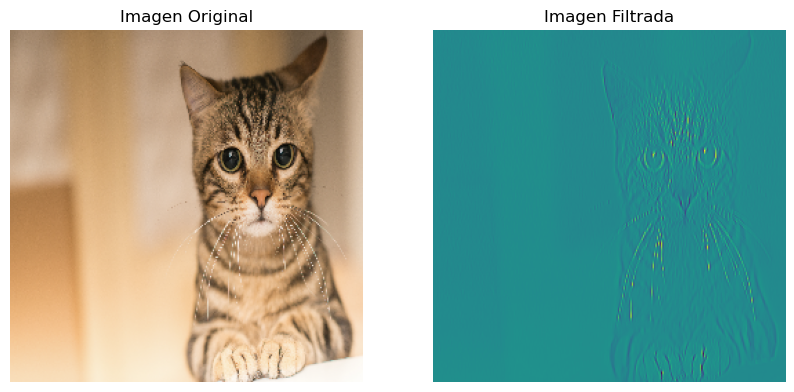

In [64]:
# Visualizar los resultados
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagen Original")
plt.imshow(input_image[0])  # Mostrar la imagen original
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Imagen Filtrada")
plt.imshow(resultado[0, :, :, 0])  # Mostrar la imagen filtrada
plt.axis("off")
plt.show()

## EJERCICIO 7
Repite el ejercicio anterior con diferentes modelos y filtros:
* Prueba otro filtro (mostrar imagen original e imagen con filtro)
* Prueba con tres filtros a la vez (mostrar la imagen resultante de cada filtro)
* Prueba con tres filtros y dos capas convolucionales (mostrar imagen original e imagne con filtro)

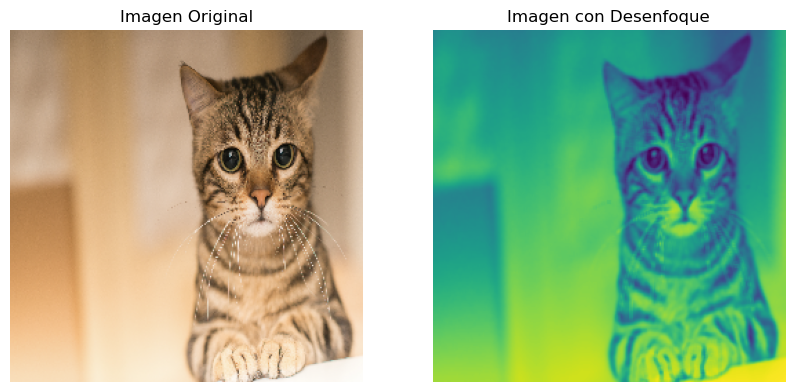

In [65]:
# Filtro de desenfoque
blur_filter = np.array([
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]],
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]],
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]]
], dtype=np.float32)
blur_filter = blur_filter.reshape((blur_filter.shape[0], blur_filter.shape[1], blur_filter.shape[2], 1))
# Creamos el modelo
blur_model = tf.keras.Sequential(
    [tf.keras.layers.Conv2D(filters=1, kernel_size=(3, 3), use_bias=False, input_shape=(224, 224, 3))]
)

# Le ponemos el filtro a la capa
blur_model.layers[0].set_weights([blur_filter])

blurred_image = blur_model(input_image)

# Visualizar
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Imagen Original")
plt.imshow(input_image[0])
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Imagen con Desenfoque")
plt.imshow(blurred_image[0, :, :, 0])
plt.axis("off")
plt.show()

/home/iabd/anaconda3/envs/entornoJon/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


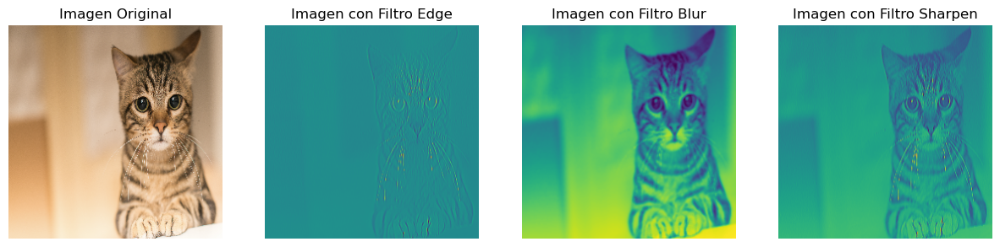

In [70]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Definir los filtros
edge_filter = np.array([
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]
], dtype=np.float32)

blur_filter = np.array([
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]],
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]],
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]]
], dtype=np.float32)

sharpen_filter = np.array([
    [[0, -1, 0], [-1, 5, -1], [0, -1, 0]],
    [[0, -1, 0], [-1, 5, -1], [0, -1, 0]],
    [[0, -1, 0], [-1, 5, -1], [0, -1, 0]]
], dtype=np.float32)

# Añadir una dimensión extra para que tengan forma 4D
edge_filter = edge_filter.reshape((edge_filter.shape[0], edge_filter.shape[1], edge_filter.shape[2], 1))
blur_filter = blur_filter.reshape((blur_filter.shape[0], blur_filter.shape[1], blur_filter.shape[2], 1))
sharpen_filter = sharpen_filter.reshape((sharpen_filter.shape[0], sharpen_filter.shape[1], sharpen_filter.shape[2], 1))

# Crear el modelo
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=3, kernel_size=(3, 3), use_bias=False, input_shape=(224, 224, 3))
])

# Asignar los filtros a la capa de convolución
model.layers[0].set_weights([np.concatenate([edge_filter, blur_filter, sharpen_filter], axis=-1)])

# Obtener la salida del modelo
blurred_image = model(input_image)

# Visualizar las imágenes después de aplicar los filtros
plt.figure(figsize=(15, 10))

# Mostrar imagen original
plt.subplot(1, 4, 1)
plt.title("Imagen Original")
plt.imshow(input_image[0])
plt.axis("off")

# Mostrar imágenes de cada filtro
headers = ["Edge","Blur","Sharpen"]
for i in range(blurred_image.shape[-1]):
    plt.subplot(1, 4, i + 2)
    plt.title(f"Imagen con Filtro {headers[i]}")
    plt.imshow(blurred_image[0, :, :, i])
    plt.axis("off")

plt.show()


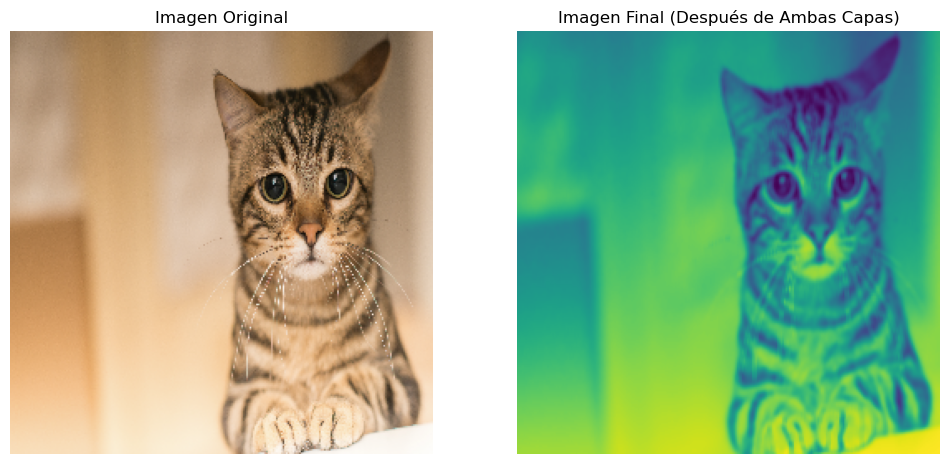

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Definir los filtros para la primera capa
edge_filter = np.array([
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]],
    [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]
], dtype=np.float32)

blur_filter = np.array([
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]],
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]],
    [[1, 1, 1], [1, 1, 1], [1, 1, 1]]
], dtype=np.float32)

sharpen_filter = np.array([
    [[0, -1, 0], [-1, 5, -1], [0, -1, 0]],
    [[0, -1, 0], [-1, 5, -1], [0, -1, 0]],
    [[0, -1, 0], [-1, 5, -1], [0, -1, 0]]
], dtype=np.float32)

# Añadir una dimensión extra (4D) para cada filtro de la primera capa
edge_filter = edge_filter.reshape((edge_filter.shape[0], edge_filter.shape[1], edge_filter.shape[2], 1))
blur_filter = blur_filter.reshape((blur_filter.shape[0], blur_filter.shape[1], blur_filter.shape[2], 1))
sharpen_filter = sharpen_filter.reshape((sharpen_filter.shape[0], sharpen_filter.shape[1], sharpen_filter.shape[2], 1))

# Definir un filtro adicional para la segunda capa (puede ser cualquier filtro)
additional_filter = np.array([
    [[0, 0, 0], [0, 1, 0], [0, 0, 0]],
    [[0, 0, 0], [0, 1, 0], [0, 0, 0]],
    [[0, 0, 0], [0, 1, 0], [0, 0, 0]]
], dtype=np.float32)

# Añadir una dimensión extra para el filtro adicional de la segunda capa
additional_filter = additional_filter.reshape((additional_filter.shape[0], additional_filter.shape[1], additional_filter.shape[2], 1))

# Crear el modelo con dos capas de convolución
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=3, kernel_size=(3, 3), use_bias=False, input_shape=(224, 224, 3)),  # Primera capa
    tf.keras.layers.Conv2D(filters=1, kernel_size=(3, 3), use_bias=False)  # Segunda capa
])

# Asignar los filtros a la primera capa (3 filtros)
model.layers[0].set_weights([np.concatenate([edge_filter, blur_filter, sharpen_filter], axis=-1)])

# Asignar el filtro a la segunda capa (1 filtro)
model.layers[1].set_weights([additional_filter])

# Obtener la salida del modelo (aplicar ambas capas de convolución)
final_image = model(input_image)

# Visualizar la imagen original y la imagen final lado a lado
plt.figure(figsize=(12, 6))

# Mostrar la imagen original
plt.subplot(1, 2, 1)
plt.title("Imagen Original")
plt.imshow(input_image[0])
plt.axis("off")

# Mostrar la imagen final después de ambas capas
plt.subplot(1, 2, 2)
plt.title("Imagen Final (Después de Ambas Capas)")
plt.imshow(final_image[0, :, :, 0])
plt.axis("off")

plt.show()
